# Исследование рынка общественного питания Москвы

__Цель:__ подготовить исследование рынка общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего для инвестиций места

__Данные:__ файл `moscow_places.csv`:

- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽»;
    - и так далее;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

__План работ:__

1. Загрузка данных и общая информация
2. Предобработка данных
    - дубликаты
    - пропуски
    - столбец street с названиями улиц из столбца с адресом
    - столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
3. Анализ данных
    - категории заведений представленные в данных, количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее.
    - количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее
    - соотношение сетевых и несетевых заведений в датасете
    - категории сетевых заведений 
    - топ-15 популярных сетей в Москве
    - административные районы Москвы в датасете
    - распределение средних рейтингов по категориям заведений
    - фоновую картограмма (хороплет) со средним рейтингом заведений каждого района
    - заведения датасета на карте 
    - топ-15 улиц по количеству заведений
    - улицы, на которых находится только один объект общепита
    - медианный чек заведений на фоновой картограмму (хороплет) для каждого района
    - часы работы заведений и их зависимость от расположения и категории заведения
    - особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений
4. Кофейни
    - количество кофеен в датасете, в каких районах их больше всего, особенности их расположения
    - круглосуточные кофейни
    - рейтинги кофеен рейтинги, их распределение по районам
    - стоимость чашки капучино
    - рекомендацию для открытия нового заведения
5. Презентация
6. Общий вывод

### Загрузка данных и общая информация

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
import json
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster

In [2]:
try:
    df = pd.read_csv('/datasets/moscow_places.csv')
    moscow_json = '/datasets/admin_level_geomap.geojson'
except:
    df = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
    moscow_json = 'https://code.s3.yandex.net//datasets/admin_level_geomap.geojson'

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
df.sample(5, random_state=150)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
5618,Ozera,столовая,"Москва, Верейская улица, 11",Западный административный округ,пн-пт 08:00–17:00,55.710043,37.447521,4.7,средние,Средний счёт:200–400 ₽,300.0,NaN,0,NaN
1249,Deli2Go,быстрое питание,"Москва, улица Маршала Прошлякова, 11",Северо-Западный административный округ,NaN,55.788906,37.389214,3.8,NaN,NaN,NaN,NaN,1,NaN
4545,Дом 16,"бар,паб","Москва, Покровский бульвар, 16-18с4-4А",Центральный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–06:00; вс 12:00...",55.753353,37.646221,3.7,NaN,NaN,NaN,NaN,0,NaN
7789,Эгриси,кафе,"Москва, Шипиловский проезд, 39, корп. 1",Южный административный округ,"ежедневно, 12:00–23:00",55.611742,37.696182,4.3,средние,Средний счёт:500–1500 ₽,1000.0,NaN,0,75.0
63,Pizza Hut,пиццерия,"Москва, Череповецкая улица, 12",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.898081,37.571696,4.2,средние,Средний счёт:600–700 ₽,650.0,NaN,1,12.0


In [5]:
df.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


In [6]:
df.category.unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

#### Вывод

В имеющихся данных:
- 8406 записей
- пропуски в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats
- столбец seats имеет несоответствующий тип данных из-за наличия пропусков
- минимальный средний чек - 958, максимальный 35000, медиана - 750
- минимальная средняя стоимость чашки капучино - 174, максимальная 1568, медиана - 169
- восемь категорий заведений

### Предобработка данных

In [7]:
# Посмотрим на названия заведений

np.set_printoptions(threshold=np.inf)
np.sort(df.name.unique())

array(['#КешбэкКафе', '+39 Pizzeria Mozzarella bar', '1 Этаж',
       '1-я Креветочная', '10 Идеальных Пицц', '1001 Ночь', '100ловая',
       '100лоффка', '13', '13 Chef doner', '15 Kitchen+Bar', '15-й Шар',
       '16 Июня', '16 Тонн', '18 Грамм', '1901 Comfort Food Zone', '1у',
       '2 Типа', '2-й Этаж', '2046', '21 Век', '22 Акра Кофе&Хлеб',
       '2U-Ту-Ю', '3 Ступени', '351 Bar', '4 Сезона', '4.2. Bar',
       '4/1 Restaurant', '42 Coffee Shop', '47', '495', '4friends Coffee',
       '4tuna Cafe&Grill', '5 Stars Coffee', '55.709201, 37.392257',
       '6 Am Bread Kitchen', '6 Рукопожатий', '69 раков', '7 Сэндвичей',
       '7 элемент', '7/12', '8 Oz', '8 Вафель', '8 Зёрен', '8 Пончиков',
       '800°с Contemporary Steak', '8bit Pizza', '9 Bar Coffe',
       '9 Bar Coffee', '9 Зёрен', 'A-cafe', 'ABC Coffee Roasters',
       'ABC coffee roasters', 'Acai Family', 'Accent', "Adam's Chicken",
       'Adria Mare', 'Ahava', 'Air Coffee', 'Al Halal',
       'Al33 Пиццерия бар Боттега',

В названиях заведений видим "Халва, Сеть Почтоматов", "Яндекс.Лавка", "Яндекс Лавка", "Яндекс Еда", которые не являются местами общественного питания. Исключим эти данные.  

In [8]:
for name in ['Халва, Сеть Почтоматов', 'Яндекс.Лавка', 'Яндекс Лавка', 'Яндекс Еда']:
    df = df.drop(df[df['name'] == name].index)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8330 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8330 non-null   object 
 1   category           8330 non-null   object 
 2   address            8330 non-null   object 
 3   district           8330 non-null   object 
 4   hours              7798 non-null   object 
 5   lat                8330 non-null   float64
 6   lng                8330 non-null   float64
 7   rating             8330 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8330 non-null   int64  
 13  seats              4760 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 976.2+ KB


In [10]:
# приведем названия к нижнему регистру, чтобы избежать дублирования из-за различного написания названий
df['name'] = df['name'].str.lower()

In [11]:
df.duplicated().sum()

0

Полных дубликатов в данных нет. Посмотрим, есть ли частично совпадающие по названию, адресу и району

In [12]:
df.duplicated(subset = ['name', 'address', 'district']).sum()

3

In [13]:
df[df.duplicated(subset = ['name', 'address', 'district'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [14]:
# уберём обнаруженные частичные дубликаты

df.drop_duplicates(subset=['name', 'address', 'district'], keep='first', inplace=True)

In [15]:
df.isna().mean().sort_values(ascending=False)

middle_coffee_cup    0.935751
middle_avg_bill      0.621833
price                0.601897
avg_bill             0.541732
seats                0.428726
hours                0.063768
name                 0.000000
category             0.000000
address              0.000000
district             0.000000
lat                  0.000000
lng                  0.000000
rating               0.000000
chain                0.000000
dtype: float64

Наибольшее число пропусков в столбце `middle_coffee_cup`, за ним сразу идет столбец `middle_avg_bill`. Напомним, что значения в этих столбцах зависят от столбца `avg_bill`. К сожалению, восстановить каким-то образом эти значения не получится, удалить их также невозможно - потеряем значительное количество данных 

In [16]:
df['street'] = df['address'].str.split(', ').str[1]

In [17]:
df['is_24/7'] = np.where(df['hours'].notna() & (df['hours'].str.contains('круглосуточно') & df['hours'].str.contains('ежедневно')), True, False)

#### Выводы

- в названиях заведений видим "Халва, Сеть Почтоматов", "Яндекс.Лавка", "Яндекс Лавка", "Яндекс Еда", которые не являются местами общественного питания, строки были исключены
- полных дубликатов нет, но было 3 записи с частичным дублированием по названию, адресу и району
- в столбцах имеются пропуски, но удалить их или каким-то образом восполнить не представляется возможным

### Анализ данных

#### Категории заведений 

In [18]:
category_table = df.groupby('category').agg({'category' : ['count']})
category_table.columns = category_table.columns.droplevel()
category_table = category_table.reset_index()
category_table = category_table.rename(columns= {'category': 'Категория заведения', 'count':'Количество заведений'})
category_table

,Категория заведения,Количество заведений
0,"бар,паб",764
1,булочная,256
2,быстрое питание,603
3,кафе,2374
4,кофейня,1413
5,пиццерия,633
6,ресторан,1969
7,столовая,315


In [19]:
fig = px.bar(category_table.sort_values(by='Количество заведений', ascending=False), 
             x='Количество заведений', 
             y='Категория заведения',
             color='Категория заведения',
             text='Количество заведений', 
             title='Количество заведений по категориям')
            
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(yaxis_title='Категория заведений',
                  xaxis_title='Количество заведений',
                  showlegend=True, legend_title='Категория заведения')
fig.show() 

Больше всего в Москве заведений категории "Кафе" (2374), за ними следуют рестораны (1969) и кофейни (1413). Меньше всего - булочных.   

#### Медианное количество посадочных мест

In [20]:
seats_table = df.groupby('category').agg({'seats' : ['median']}).round(0)
seats_table.columns = seats_table.columns.droplevel()
seats_table = seats_table.reset_index()
seats_table = seats_table.rename(columns= {'category': 'Категория заведения', 'median':'Медианное количество посадочных мест'})
seats_table

,Категория заведения,Медианное количество посадочных мест
0,"бар,паб",82.0
1,булочная,50.0
2,быстрое питание,65.0
3,кафе,60.0
4,кофейня,80.0
5,пиццерия,55.0
6,ресторан,89.0
7,столовая,76.0


In [21]:
fig = px.bar(seats_table.sort_values(by='Медианное количество посадочных мест', ascending=False), 
             x='Медианное количество посадочных мест', 
             y='Категория заведения',
             color='Категория заведения',
             text='Медианное количество посадочных мест', 
             title='Медианное количество посадочных мест по категориям')
            
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(yaxis_title='Категория заведений',
                  xaxis_title='Медианное количество посадочных мест',
                  showlegend=True, legend_title='Категория заведения')
fig.show() 

По медианному количеству посадочных мест, на первой позиции оказались рестораны, за ними бары,пабы и кофейни.
Медиана взята в качестве показателя, т.к. в данных имеются заведения с очень большим числом мест(вероятно это фудкорты)

#### Соотношение сетевых и несетевых заведений

In [22]:
df['chain'].value_counts()

0    5199
1    3128
Name: chain, dtype: int64

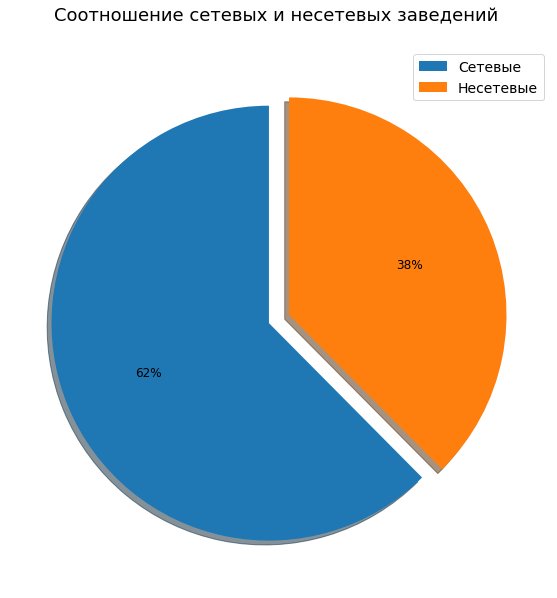

In [23]:
df['chain'].value_counts().plot(kind='pie',
                                figsize=(15,10),
                                autopct='%1.0f%%',
                                rot=0,
                                fontsize=12,
                                legend=True,
                                labeldistance=None,
                                shadow=True,
                                explode=[0.05, 0.05],
                                startangle=90,
                                grid=True).set_title('Соотношение cетевых и несетевых заведений \n',
                                                                    fontsize=18);
plt.legend(['Сетевые','Несетевые'], prop={'size': 14}, loc='upper right')
plt.ylabel('');

В данных по Москве преобладают сетевые заведения, которых оказалось 62% от общего числа записей

#### Процент сетевых заведений по категориям

In [24]:
chain_table = df.groupby('category').agg({'category' : ['count'], 'chain': ['sum']})
chain_table.columns = chain_table.columns.droplevel()
chain_table = chain_table.reset_index()
chain_table = chain_table.rename(columns= {'category': 'Категория заведения', 
                                           'count':'Количество заведений', 
                                           'sum': 'Количество сетевых заведений'})
chain_table['Процент сетевых заведений'] = round(chain_table['Количество сетевых заведений'] / chain_table['Количество заведений'] * 100) 
chain_table

,Категория заведения,Количество заведений,Количество сетевых заведений,Процент сетевых заведений
0,"бар,паб",764,168,22.0
1,булочная,256,157,61.0
2,быстрое питание,603,232,38.0
3,кафе,2374,776,33.0
4,кофейня,1413,720,51.0
5,пиццерия,633,330,52.0
6,ресторан,1969,657,33.0
7,столовая,315,88,28.0


In [25]:
fig = px.bar(chain_table.sort_values(by='Процент сетевых заведений', ascending=False), 
             x='Процент сетевых заведений', 
             y='Категория заведения',
             color='Категория заведения',
             text='Процент сетевых заведений', 
             title='Процент сетевых заведений по категориям')
            
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(yaxis_title='Категория заведений',
                  xaxis_title='Процент сетевых заведений',
                  showlegend=True, legend_title='Категория заведения')
fig.show() 

Чаще сетевыми заведениями оказываются булочные, пиццерии и кофейни. Менее распространены сетевые бары, пабы и столовые 

#### ТОП-15 сетей по количеству заведений в Москве

In [26]:
top_chain = df[df['chain'] == 1].groupby('name').agg({'name':['count'], 'category': ['first']})
top_chain.columns = top_chain.columns.droplevel()
top_chain = top_chain.reset_index()
top_chain = top_chain.rename(columns= {'name': 'Название заведения', 'count':'Количество заведений в сети', 'first': 'Категория заведения'})
top_chain = top_chain.merge(category_table, on='Категория заведения', how='left')
top_chain['Процент об общего количества'] = round(top_chain['Количество заведений в сети'] / top_chain['Количество заведений'] * 100, 1)
top_chain = top_chain.sort_values(by='Количество заведений в сети', ascending=False).head(15)
top_chain = top_chain.reset_index(drop=True)
top_chain

,Название заведения,Количество заведений в сети,Категория заведения,Количество заведений,Процент об общего количества
0,шоколадница,120,кофейня,1413,8.5
1,домино'с пицца,76,пиццерия,633,12.0
2,додо пицца,74,пиццерия,633,11.7
3,one price coffee,71,кофейня,1413,5.0
4,cofix,65,кофейня,1413,4.6
5,prime,50,ресторан,1969,2.5
6,хинкальная,44,быстрое питание,603,7.3
7,кофепорт,42,кофейня,1413,3.0
8,кулинарная лавка братьев караваевых,39,кафе,2374,1.6
9,теремок,38,ресторан,1969,1.9


In [27]:
fig = px.bar(top_chain, 
             x='Количество заведений в сети', 
             y='Название заведения',
             color='Название заведения',
             text='Количество заведений в сети', 
             title='ТОП-15 популярных сетей')
            
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(yaxis_title='Название заведения',
                  xaxis_title='Количество заведений в сети',
                  showlegend=False)
fig.show() 

По количеству заведений, с большим отрывом вперёд вырывается сеть "Шоколадница" (120), далее следуют "Домино'c пицца", "Додо пицца" и "one price coffee". 

Чаще всего, среди самых распространённых сетей встречаются кофейни - вероятно, распространённость этих заведений обусловлена форматом такого рода заведений (небольшая площадь, относительно небольшая стоимость открытия нового заведения и т.п.)

Все сетевые заведения объединяет в первую очередь доступные цены, что позволяет охватывать широкую аудиторию покупателей.

#### Распределение категорий заведений по административным округам

In [28]:
district_table = (
                 df.pivot_table(index='district', columns='category', values='name', aggfunc='count')
                 .merge(df.groupby('district')['name'].count().reset_index(), on='district')
                 )
district_table = district_table.rename(columns = {'name': 'общее количество', 'district': 'округ'})
district_table.sort_values(by = 'общее количество', ascending = False)

,округ,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,общее количество
5,Центральный административный округ,364,50,87,464,428,113,665,66,2237
2,Северный административный округ,68,39,58,235,193,77,184,41,895
3,Северо-Восточный административный округ,62,28,82,268,159,68,175,40,882
8,Южный административный округ,68,25,85,264,131,73,190,44,880
1,Западный административный округ,50,37,62,238,150,71,208,24,840
0,Восточный административный округ,53,25,71,271,105,72,148,40,785
6,Юго-Восточный административный округ,38,13,67,281,89,55,136,25,704
7,Юго-Западный административный округ,38,27,61,238,96,64,157,17,698
4,Северо-Западный административный округ,23,12,30,115,62,40,106,18,406


In [29]:
fig = px.bar(district_table.sort_values(by = 'общее количество', ascending = False), 
             x='округ', 
             y=['бар,паб','булочная','быстрое питание','кафе','кофейня','пиццерия','ресторан','столовая'],
             color_discrete_sequence=px.colors.qualitative.G10)

fig.update_layout(yaxis_title='Общее количество заведений',
                  xaxis_title='Округ',
                  showlegend=True, legend_title='Категория заведения',
                  title='Распределение категорий заведений по округам',
                  margin={"r": 0, "t": 50, "l": 0, "b": 0},
                  hovermode="x unified")
fig.show() 

Как видно из графика, большее количество заведений представлено в Центральном административном округе. Там располагается относительно больше ресторанов, кофеен, баров и пабов, чем в остальных округах.

Примечательно, что соотношение остальных категорий заведений примерно одинаковое.

#### Средний рейтинг по категориям заведений

In [30]:
ratings_table = df.groupby('category').agg({'rating' : ['mean']}).round(2)
ratings_table.columns = ratings_table.columns.droplevel()
ratings_table = ratings_table.reset_index()
ratings_table = ratings_table.rename(columns= {'category': 'Категория заведения', 'mean':'Средний рейтинг'})
ratings_table

,Категория заведения,Средний рейтинг
0,"бар,паб",4.39
1,булочная,4.27
2,быстрое питание,4.05
3,кафе,4.12
4,кофейня,4.28
5,пиццерия,4.30
6,ресторан,4.31
7,столовая,4.21


In [31]:
fig = px.bar(ratings_table.sort_values(by='Средний рейтинг', ascending=False), 
             x='Средний рейтинг', 
             y='Категория заведения',
             color='Категория заведения',
             text='Средний рейтинг', 
             title='Средний рейтинг заведений по категориям')
            
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(yaxis_title='Категория заведений',
                  xaxis_title='Средний рейтинг',
                  showlegend=True, legend_title='Категория заведения')
fig.show() 

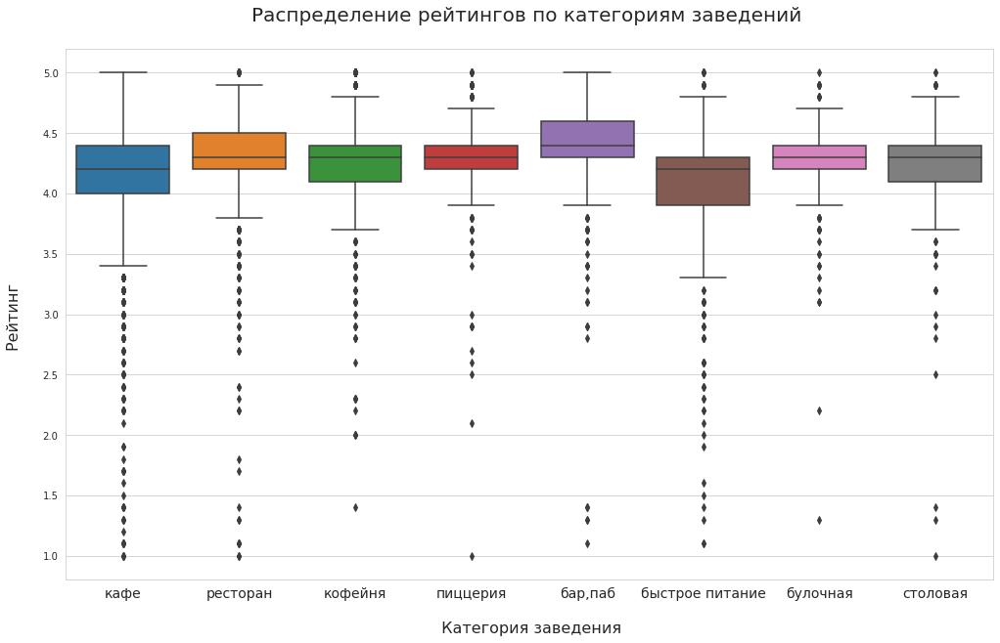

In [69]:
plt.figure(figsize=(17, 10))
plt.title('Распределение рейтингов по категориям заведений \n', fontsize=20)
sns.set_style('whitegrid') 
ax = sns.boxplot(x='category', y='rating', data=df)
plt.xticks(fontsize=14)
plt.xlabel('\n Категория заведения', fontsize=16)
plt.ylabel('Рейтинг \n', fontsize=16);

Наиболее высоким рейтингом среди всех категорий обладают бары, пабы. Самым низким - заведения категории "быстрое питание".

Следует отметить, что в среднем, категории заведений не сильно отличаются по рейтингам и находятся в пределах 4 баллов

#### Рейтинг заведений по округам

In [32]:
district_ratings_table = (df.groupby('district', as_index=False)['rating'].agg('mean')).round(2)
district_ratings_table = district_ratings_table.rename(columns= {'district': 'округ', 'rating':'cредний рейтинг'})
district_ratings_table.sort_values(by='cредний рейтинг', ascending = False).reset_index(drop=True)

,округ,cредний рейтинг
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Западный административный округ,4.19
4,Южный административный округ,4.19
5,Восточный административный округ,4.18
6,Юго-Западный административный округ,4.18
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.11


In [33]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=moscow_json,
    data=district_ratings_table,
    columns=['округ', 'cредний рейтинг'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по округам',
).add_to(m)

m

Как видим на карте, в ЦАО заведения обладают более высоким рейтнигом.

Опять же, разнциа в рейтнига невысока и находится в пределах 4 баллов

#### Все заведения датасета на карте

In [34]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

df.apply(create_clusters, axis=1)

m

Как и было отмечено в таблицах выше, большая часть заведений расположилась в ЦАО, что и нашло своё отображение в кластерах на карте

#### ТОП-15 улиц по количеству заведений

In [35]:
street_table = (
                 df.pivot_table(index='street', columns='category', values='name', aggfunc='count')
                 .merge(df.groupby('street')['name'].count().reset_index(), on='street')
                 )
street_table = street_table.rename(columns = {'name': 'количество заведений', 'street': 'улица'})
top_street_table = street_table.sort_values(by = 'количество заведений', ascending = False).head(15)
top_street_table

,улица,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,количество заведений
1085,проспект Мира,11.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0,183
768,Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,25.0,3.0,121
1082,проспект Вернадского,7.0,1.0,12.0,25.0,16.0,12.0,31.0,2.0,106
521,Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,32.0,5.0,106
519,Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0,95
370,Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,23.0,4.0,87
452,Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0,77
295,Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,18.0,7.0,74
520,Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0,70
546,МКАД,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0,65


In [36]:
fig = px.bar(top_street_table, 
             x='улица', 
             y=['бар,паб','булочная','быстрое питание','кафе','кофейня','пиццерия','ресторан','столовая'],
             color_discrete_sequence=px.colors.qualitative.G10)

fig.update_layout(yaxis_title='Общее количество заведений',
                  xaxis_title='Улица',
                  showlegend=True, legend_title='Категория заведения',
                  title='Топ-15 улиц по количеству заведений и их категории',
                  margin={"r": 0, "t": 30, "l": 0, "b": 0},
                  hovermode="x unified")
fig.show() 

Глядя на график распределения заведений, можно предположить, что количество заведений зависит от протяженности и от округа в котором улица расположена. 

Например, Проспект мира - улица с протяженность 8км, которая находится в центре с самым большим числом заведений и МКАД - 108км, но при этом количество заведений гораздо меньше и превалирующая категория - "кафе".  

#### Улицы, на которых только одно заведение

In [37]:
one_place_table = df[df['street']
                            .isin(street_table.query("`количество заведений` == 1")
                                .sort_values(by='количество заведений', ascending=True)['улица'])]
one_place_table.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
58,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
60,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False


In [38]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

marker_cluster = MarkerCluster().add_to(m)


one_place_table.apply(create_clusters, axis=1)

m

In [39]:
one_place_table['street'].count()

458

In [70]:
one_place_by_district = one_place_table.groupby('district').agg({'name':'count'})
one_place_by_district = one_place_by_district.reset_index()
one_place_by_district = one_place_by_district.rename(columns= {'district': 'Округ', 'name':'Количество улиц с одним заведением'})
one_place_by_district.sort_values(by = 'Количество улиц с одним заведением', ascending = False).reset_index(drop=True)

,Округ,Количество улиц с одним заведением
0,Центральный административный округ,144
1,Северо-Восточный административный округ,55
2,Восточный административный округ,53
3,Северный административный округ,52
4,Южный административный округ,43
5,Юго-Восточный административный округ,40
6,Западный административный округ,34
7,Северо-Западный административный округ,19
8,Юго-Западный административный округ,18


Всего в датасете 458 улиц, на которых расположено всего одно заведение.

На карте и таблице видим, что большая часть таких улиц расположена в центре. Вероятно, наличие единственного заведения на улице в центре обуславливается исторической застройкой, где протяженность улиц может быть очень маленькой

#### Медианный чек по округам

In [41]:
district_price_table = (df.groupby('district', as_index=False)['middle_avg_bill'].agg('median')).round(2)
district_price_table = district_price_table.rename(columns= {'district': 'округ', 'middle_avg_bill':'медианный чек'})
district_price_table.sort_values(by='медианный чек', ascending = False).reset_index(drop=True)

,округ,медианный чек
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [42]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=moscow_json,
    data=district_price_table,
    columns=['округ', 'медианный чек'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный чек по округам',
).add_to(m)

m

Из таблици и карты видим, что наиболее дорогие заведния располагаются в ЦАО и ЗАО. В остальных оркугах цены более доступны широкой аудитории

#### Общий вывод

- Больше всего в Москве заведений категории "Кафе" (2374), за ними следуют рестораны (1969) и кофейни (1413). Меньше всего - булочных.
- По медианному количеству посадочных мест, на первой позиции оказались рестораны, за ними бары,пабы и кофейни. Медиана взята в качестве показателя, т.к. в данных имеются заведения с очень большим числом мест(вероятно это фудкорты)
- В данных по Москве преобладают сетевые заведения, которых оказалось 62% от общего числа записей
- Чаще сетевыми заведениями оказываются булочные, пиццерии и кофейни. Менее распространены сетевые бары, пабы и столовые
- По количеству заведений, с большим отрывом вперёд вырывается сеть "Шоколадница" (120), далее следуют "Домино'c пицца", "Додо пицца" и "one price coffee".
- Чаще всего, среди самых распространённых сетей встречаются кофейни - вероятно, распространённость этих заведений обусловлена форматом такого рода заведений (небольшая площадь, относительно небольшая стоимость открытия нового заведения и т.п.)
- Все сетевые заведения объединяет в первую очередь доступные цены, что позволяет охватывать широкую аудиторию покупателей.
- Большее количество заведений представлено в Центральном административном округе. Там располагается относительно больше ресторанов, кофеен, баров и пабов, чем в остальных округах. Соотношение остальных категорий заведений примерно одинаковое.
- Наиболее высоким рейтингом среди всех категорий обладают бары, пабы. Самым низким - заведения категории "быстрое питание".
- В ЦАО заведения обладают более высоким рейтингом
- В среднем, категории заведений не сильно отличаются по рейтингам и находятся в пределах 4 баллов
- Можно предположить, что количество заведений на улице зависит от протяженности и от округа в котором улица расположена. 
- Большая часть улиц с одним заведением расположена в центре. Вероятно, наличие единственного заведения на улице в центре обуславливается исторической застройкой, где протяженность улиц может быть очень маленькой
- наиболее дорогие заведения располагаются в ЦАО и ЗАО

### Кофейни

#### Количество кофеен по округам

In [43]:
district_table[['округ','кофейня']].sort_values(by='кофейня', ascending = False).reset_index(drop=True)

,округ,кофейня
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [44]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=moscow_json,
    data=district_table[['округ','кофейня']],
    columns=['округ','кофейня'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен по округам',
).add_to(m)

m

Из таблицы и карты видим, что большая часть кофеен в Москве располагается в ЦАО. Меньше всего кофеен в СЗАО

#### Круглосуточные кофейни

In [45]:
df[(df['category'] == "кофейня") & (df['hours'].str.contains('круглосуточно'))]['name'].count()

76

In [46]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

df[(df['category'] == "кофейня") & (df['hours'].str.contains('круглосуточно'))].apply(create_clusters, axis=1)

m

Круглосуточных кофеен в городе не так много - всего лишь 76 и большая часть из них расположена в ЦАО

#### Средний рейтинг кофеен по округам

In [47]:
coffeeshop_ratings_table = df[df['category'] == "кофейня"].groupby('district').agg({'rating' : ['mean']}).round(2)
coffeeshop_ratings_table.columns = coffeeshop_ratings_table.columns.droplevel()
coffeeshop_ratings_table = coffeeshop_ratings_table.reset_index()
coffeeshop_ratings_table = coffeeshop_ratings_table.rename(columns= {'district': 'округ', 'mean':'средний рейтинг кофеен'})
coffeeshop_ratings_table.sort_values(by='средний рейтинг кофеен', ascending = False).reset_index(drop=True)

,округ,средний рейтинг кофеен
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
3,Восточный административный округ,4.28
4,Юго-Западный административный округ,4.28
5,Юго-Восточный административный округ,4.23
6,Южный административный округ,4.23
7,Северо-Восточный административный округ,4.22
8,Западный административный округ,4.20


In [48]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=moscow_json,
    data=coffeeshop_ratings_table,
    columns=['округ','средний рейтинг кофеен'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Рейтинг кофеен по округам',
).add_to(m)

m

Из таблицы и карты видно, что наиболее высокий рейтинг у кофеен, расположеных в ЦАО и СЗАО. Хотя в целом, разница в рейтнингах остаётся в пределах 4 баллов

#### Медианная цена чашки капучино по округам

In [49]:
coffeeshop_prices_table = df[df['category'] == "кофейня"].groupby('district')['middle_coffee_cup'].median().round(0).reset_index()
coffeeshop_prices_table = coffeeshop_prices_table.rename(columns={'district': 'округ', 'middle_coffee_cup': 'медианная цена чашки капучино'})
coffeeshop_prices_table.sort_values(by='медианная цена чашки капучино', ascending = False).reset_index(drop=True)

,округ,медианная цена чашки капучино
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.0
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,148.0
8,Восточный административный округ,135.0


In [50]:
fig = px.bar(coffeeshop_prices_table.sort_values(by = 'медианная цена чашки капучино', ascending = False), 
             x='округ', 
             y='медианная цена чашки капучино',
             color='округ')

fig.update_layout(yaxis_title='Медианная цена',
                  xaxis_title='Округ',
                  showlegend=False,
                  title='Медианная цена чашки кофе по округам')
fig.show()

Здесь видим, что ЦАО немного уступил первенство ЮЗАО в медианной цене чашки капучино, ЗАО на третьем месте, СЗАО - на четвертом.
Самая низкая цена в ВАО.

#### Общий вывод и рекомендации

- большая часть кофеен в Москве располагается в ЦАО. Меньше всего кофеен в СЗАО
- круглосуточных кофеен в городе не так много - всего лишь 76 и большая часть из них расположена в ЦАО
- наиболее высокий рейтинг у кофеен, расположенных в ЦАО и СЗАО, наиболее низкий в ЗАО
- ЦАО немного уступил первенство ЮЗАО в медианной цене чашки капучино, ЗАО на третьем месте, СЗАО - на четвертом

__Рекомендации__

Вероятно, наиболее интересный округ для открытия кофейни - СЗАО, т.к. там меньше всего кофеен, при этом рейтинг кофеен наиболее высокий и медианная цена чашки кофе 165 руб, при максимуме в 198 и минимуме в 135. Небольшое число конкурентов и готовность покупателей платить среднюю по Москве стоимость чашки капучино сделает кофейню в этом округе привлекательной. Также возможно, стоит сделать кофейню круглосуточной. 

### Презентация

Ссылка на презентацию: https://disk.yandex.ru/i/9_nmLt3zdxci8w

### Общие выводы

1. Данные

В имеющихся данных:

- 8406 записей
- пропуски в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats
- столбец seats имеет несоответствующий тип данных из-за наличия пропусков
- минимальный средний чек - 958, максимальный 35000, медиана - 750
- минимальная средняя стоимость чашки капучино - 174, максимальная 1568, медиана - 169
- восемь категорий заведений
- в названиях заведений "Халва, Сеть Почтоматов", "Яндекс.Лавка", "Яндекс Лавка", "Яндекс Еда", которые не являются местами общественного питания, строки были исключены
- полных дубликатов нет, но было 3 записи с частичным дублированием по названию, адресу и району
- в столбцах имеются пропуски, но удалить их или каким-то образом восполнить не представляется возможным

2. Анализ данных

- Больше всего в Москве заведений категории "Кафе" (2374), за ними следуют рестораны (1969) и кофейни (1413). Меньше всего - булочных.
- По медианному количеству посадочных мест, на первой позиции оказались рестораны, за ними бары,пабы и кофейни. Медиана взята в качестве показателя, т.к. в данных имеются заведения с очень большим числом мест(вероятно это фудкорты)
- В данных по Москве преобладают сетевые заведения, которых оказалось 62% от общего числа записей
- Чаще сетевыми заведениями оказываются булочные, пиццерии и кофейни. Менее распространены сетевые бары, пабы и столовые
- По количеству заведений, с большим отрывом вперёд вырывается сеть "Шоколадница" (120), далее следуют "Домино'c пицца", "Додо пицца" и "one price coffee".
- Чаще всего, среди самых распространённых сетей встречаются кофейни - вероятно, распространённость этих заведений обусловлена форматом такого рода заведений (небольшая площадь, относительно небольшая стоимость открытия нового заведения и т.п.)
- Все сетевые заведения объединяет в первую очередь доступные цены, что позволяет охватывать широкую аудиторию покупателей.
- Большее количество заведений представлено в Центральном административном округе. Там располагается относительно больше ресторанов, кофеен, баров и пабов, чем в остальных округах. Соотношение остальных категорий заведений примерно одинаковое.
- Наиболее высоким рейтингом среди всех категорий обладают бары, пабы. Самым низким - заведения категории "быстрое питание".
- В ЦАО заведения обладают более высоким рейтингом
- В среднем, категории заведений не сильно отличаются по рейтингам и находятся в пределах 4 баллов
- Можно предположить, что количество заведений на улице зависит от протяженности и от округа в котором улица расположена.
- Большая часть улиц с одним заведением расположена в центре. Вероятно, наличие единственного заведения на улице в центре обуславливается исторической застройкой, где протяженность улиц может быть очень маленькой
- Наиболее дорогие заведения располагаются в ЦАО и ЗАО
- большая часть кофеен в Москве располагается в ЦАО. Меньше всего кофеен в СЗАО
- круглосуточных кофеен в городе не так много - всего лишь 76 и большая часть из них расположена в ЦАО
- наиболее высокий рейтинг у кофеен, расположенных в ЦАО и СЗАО, наиболее низкий в ЗАО
- ЦАО немного уступил первенство ЮЗАО в медианной цене чашки капучино, ЗАО на третьем месте, СЗАО - на четвертом

3. Рекомендации

Вероятно, наиболее интересный округ для открытия кофейни - СЗАО, т.к. там меньше всего кофеен, при этом рейтинг кофеен наиболее высокий и медианная цена чашки кофе 165 руб, при максимуме в 198 и минимуме в 135. Небольшое число конкурентов и готовность покупателей платить среднюю по Москве стоимость чашки капучино сделает кофейню в этом округе привлекательной. Также возможно, стоит сделать кофейню круглосуточной. 